In [2]:
### Import Libraries

import tensorflow as tf

import os

import numpy as np

import pandas as pd

import matplotlib.pyplot as plt

import tensorflow as tf

import cv2

In [3]:
# Some basic parameters

inpDir = '../input' # location where input data is stored
outDir = '../output' # location to store outputs
dataDir = 'basic_operations'

RANDOM_STATE = 24 # for initialization ----- REMEMBER: to remove at the time of promotion to production

np.random.seed(RANDOM_STATE) # Set Random Seed for reproducible  results


# Set parameters for decoration of plots
params = {'legend.fontsize' : 'large',
          'figure.figsize'  : (15,12),
          'axes.labelsize'  : 'x-large',
          'axes.titlesize'  :'x-large',
          'xtick.labelsize' :'large',
          'ytick.labelsize' :'large',
         }


CMAP = 'jet'

LINE_THICK = 1

MARK_COLOR = (15, 82, 186)

plt.rcParams.update(params) # update rcParams

# Helper functions

#### Function to read an image

In [4]:
def fn_read_image(fileName):
  '''
    Args
  '''
  imgPath=os.path.join(inpDir,dataDir,fileName)

  #Read image file
  im=cv2.imread(imgPath,cv2.IMREAD_COLOR)

  if im is None:
    print('Could not open or find the image',fileName)
    exit(0)
  else:
    #Convert to RGB image
    rgbIm=cv2.cvtColor(im,cv2.COLOR_BGR2RGB)
    return im,rgbIm

#### Function to plot one image

In [5]:
#Showing this image

def fn_plot_one_img(im):
  '''
  
  '''
  #Showing image
  plt.imshow(im) #Plotting the image
  plt.axis('off') #no axis to dispLay
  
  #plt.savefig

#### Function to plot many images

In [6]:
def fn_plot_images(im_lst):
  """
  
  """
  nRows=1
  nCols=len(im_lst)

  fig,axes=plt.subplots(nRows,nCols)

  for i in range(nCols):

    #Display image
    axes[i].imshow(im_lst[i]['img'],cmap=im_lst[i]['cmap'])

    #Setting title of individual plot
    axes[i].set_title(im_lst[i]['name'])

    #Remove axis tics from the plot
    axes[i].set_xticklabels([]);
    axes[i].set_yticklabels([]);
  #Optiize thfn_plot_imagese plot layout
  plt.tight_layout()

### Source Image file

In [7]:
imgFileName='shapes.jpg'
srcImg,rgbImg=fn_read_image('shapes.jpg')

#### plotting CV2 image , RGB image and HSV(Hue,Saturation and Value) image

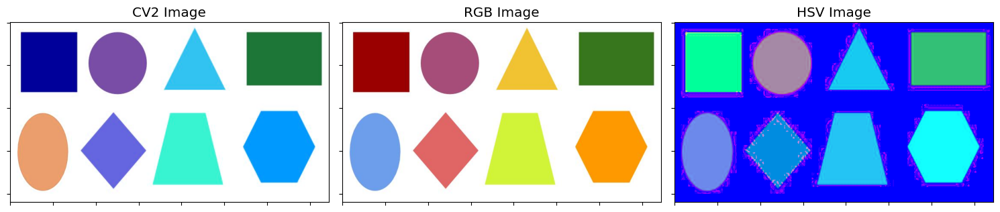

In [8]:
# Convert to HSV Image
hsvImg = cv2.cvtColor(srcImg, cv2.COLOR_BGR2HSV)

img_lst = [{'img': srcImg, 'name': 'CV2 Image', 'cmap' : CMAP},
           {'img': rgbImg, 'name': 'RGB Image', 'cmap' : CMAP},
           {'img': hsvImg, 'name': 'HSV Image','cmap' : CMAP}]

fn_plot_images(img_lst)

In [9]:
conver_method = [i for i in dir(cv2) if i.startswith('COLOR_')]
print (conver_method)

['COLOR_BAYER_BG2BGR', 'COLOR_BAYER_BG2BGRA', 'COLOR_BAYER_BG2BGR_EA', 'COLOR_BAYER_BG2BGR_VNG', 'COLOR_BAYER_BG2GRAY', 'COLOR_BAYER_BG2RGB', 'COLOR_BAYER_BG2RGBA', 'COLOR_BAYER_BG2RGB_EA', 'COLOR_BAYER_BG2RGB_VNG', 'COLOR_BAYER_BGGR2BGR', 'COLOR_BAYER_BGGR2BGRA', 'COLOR_BAYER_BGGR2BGR_EA', 'COLOR_BAYER_BGGR2BGR_VNG', 'COLOR_BAYER_BGGR2GRAY', 'COLOR_BAYER_BGGR2RGB', 'COLOR_BAYER_BGGR2RGBA', 'COLOR_BAYER_BGGR2RGB_EA', 'COLOR_BAYER_BGGR2RGB_VNG', 'COLOR_BAYER_GB2BGR', 'COLOR_BAYER_GB2BGRA', 'COLOR_BAYER_GB2BGR_EA', 'COLOR_BAYER_GB2BGR_VNG', 'COLOR_BAYER_GB2GRAY', 'COLOR_BAYER_GB2RGB', 'COLOR_BAYER_GB2RGBA', 'COLOR_BAYER_GB2RGB_EA', 'COLOR_BAYER_GB2RGB_VNG', 'COLOR_BAYER_GBRG2BGR', 'COLOR_BAYER_GBRG2BGRA', 'COLOR_BAYER_GBRG2BGR_EA', 'COLOR_BAYER_GBRG2BGR_VNG', 'COLOR_BAYER_GBRG2GRAY', 'COLOR_BAYER_GBRG2RGB', 'COLOR_BAYER_GBRG2RGBA', 'COLOR_BAYER_GBRG2RGB_EA', 'COLOR_BAYER_GBRG2RGB_VNG', 'COLOR_BAYER_GR2BGR', 'COLOR_BAYER_GR2BGRA', 'COLOR_BAYER_GR2BGR_EA', 'COLOR_BAYER_GR2BGR_VNG', 'COLOR_

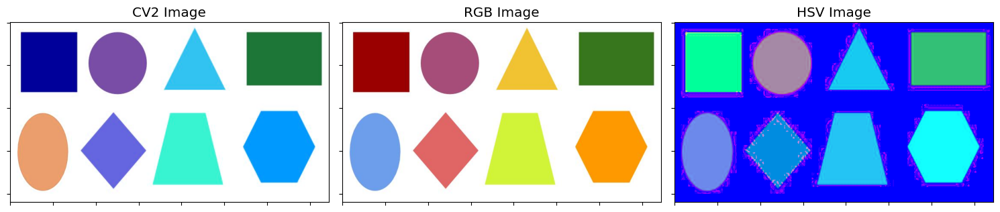

In [10]:
rgbImg = cv2.cvtColor(srcImg, cv2.COLOR_BGR2RGB)

hsvImg = cv2.cvtColor(srcImg, cv2.COLOR_BGR2HSV)

img_lst = [{'img': srcImg, 'name':'CV2 Image', 'cmap':CMAP},
          {'img': rgbImg, 'name':'RGB Image', 'cmap':CMAP},
          {'img': hsvImg, 'name':'HSV Image', 'cmap':'gray'}]

fn_plot_images(img_lst)

#### Convert to RGB to GreyScale

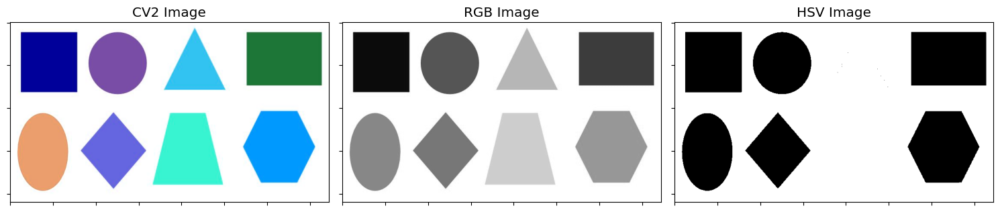

In [11]:
grayImg=cv2.cvtColor(srcImg,cv2.COLOR_BGR2GRAY)

(thresh,bwImg)= cv2.threshold(grayImg,128,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)

img_lst = [{'img': srcImg, 'name':'CV2 Image', 'cmap':CMAP},
          {'img': grayImg, 'name':'RGB Image', 'cmap':'gray'},
          {'img': bwImg, 'name':'HSV Image', 'cmap':'gray'}]

fn_plot_images(img_lst)

In [12]:
bwImg

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [13]:
redImg=rgbImg.copy()
redImg[:,:,1]=0
redImg[:,:,2]=0
print('Shape of Red Image ',redImg.shape)

greenImg=rgbImg.copy()
greenImg[:,:,0]=0
greenImg[:,:,2]=0
print('Shape of Green Image ',greenImg.shape)

blueImg=rgbImg.copy()
blueImg[:,:,0]=0
blueImg[:,:,1]=0
print('Shape of Blue Image ',blueImg.shape)

Shape of Red Image  (420, 745, 3)
Shape of Green Image  (420, 745, 3)
Shape of Blue Image  (420, 745, 3)


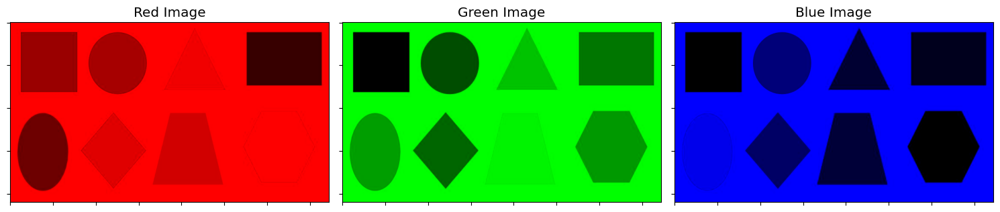

In [14]:
img_lst = [{'img': redImg, 'name':'Red Image', 'cmap':CMAP},
          {'img': greenImg, 'name':'Green Image', 'cmap':CMAP},
          {'img': blueImg, 'name':'Blue Image', 'cmap':CMAP}]

fn_plot_images(img_lst)

Shape of red Channel (420, 745)
Shape of green Channel (420, 745)
Shape of blue Channel (420, 745)


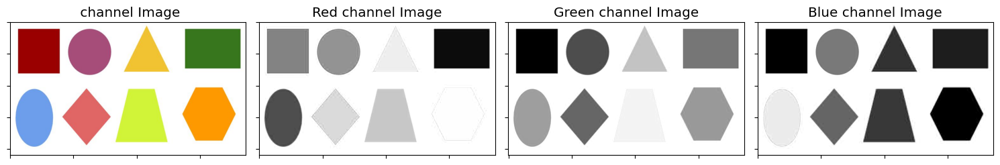

In [15]:
redChannel=rgbImg.copy()
redChannel=redChannel[:,:,0]
print('Shape of red Channel',redChannel.shape)

greenChannel=rgbImg.copy()
greenChannel=greenChannel[:,:,1]
print('Shape of green Channel',greenChannel.shape)

blueChannel=rgbImg.copy()
blueChannel=blueChannel[:,:,2]
print('Shape of blue Channel',blueChannel.shape)

img_lst = [{'img': rgbImg, 'name':' channel Image', 'cmap':'gray'},
           {'img': redChannel, 'name':'Red channel Image', 'cmap':'gray'},
          {'img': greenChannel, 'name':'Green channel Image', 'cmap':'gray'},
          {'img': blueChannel, 'name':'Blue channel Image', 'cmap':'gray'}]

fn_plot_images(img_lst)

### Gaussian Blurr


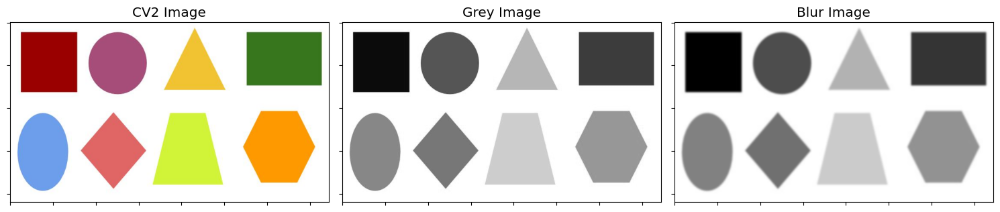

In [16]:
blurImg = cv2.GaussianBlur(grayImg, (11,11), 0)

img_lst = [{'img': rgbImg, 'name':'CV2 Image', 'cmap':CMAP},
          {'img': grayImg, 'name':'Grey Image', 'cmap':'gray'},
          {'img': blurImg, 'name':'Blur Image', 'cmap':'gray'}]

fn_plot_images(img_lst)

# Canny edge detection

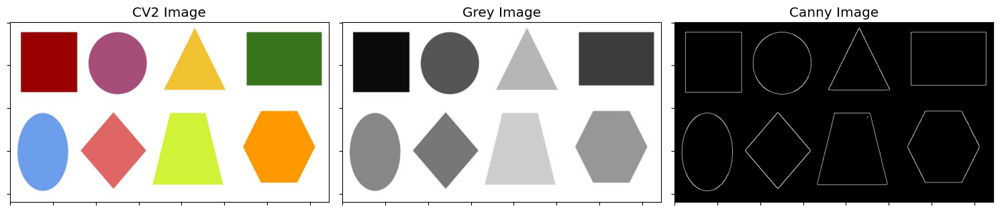

In [17]:
cannyImg = cv2.Canny(srcImg, 150, 200)


img_lst = [{'img': rgbImg, 'name':'CV2 Image', 'cmap':CMAP},
          {'img': grayImg, 'name':'Grey Image', 'cmap':'gray'},
          {'img': cannyImg, 'name':'Canny Image', 'cmap':'gray'}]

fn_plot_images(img_lst)

# Dilation and Erosion

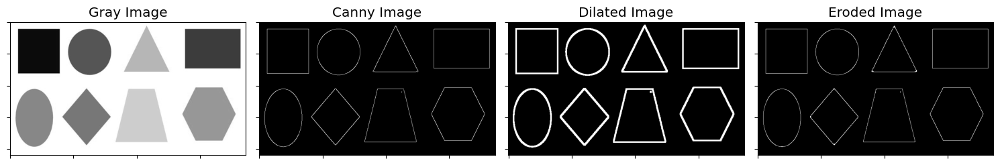

In [18]:
krnl = np.ones((5,5)) / 25

# Bringht area of the image dilates the black regions of the background
dilationImg = cv2.dilate(cannyImg, krnl, iterations = 1)

# inverse of dilation 
erodedImg = cv2.erode(dilationImg, krnl, iterations = 1)

img_lst = [{'img': grayImg, 'name':'Gray Image', 'cmap':'gray'},
          {'img': cannyImg, 'name':'Canny Image', 'cmap':'gray'},
          {'img': dilationImg, 'name':'Dilated Image', 'cmap':'gray'},
          {'img': erodedImg, 'name':'Eroded Image', 'cmap':'gray'}]

fn_plot_images(img_lst)

# Resizing and Crooping

In [19]:
width = rgbImg.shape[1]
height = rgbImg.shape[0]
print(width,height)

745 420


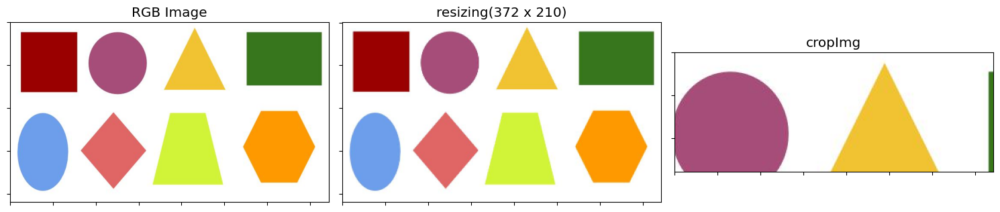

In [20]:
resizeImg = cv2.resize(rgbImg, (width//2, height//2))
cropImg = rgbImg[0:height//3,width//4:3*width//4]

img_lst = [{'img':rgbImg,'name':'RGB Image','cmap':CMAP},
           {'img':resizeImg,'name':f'resizing({width//2} x {height//2})','cmap':CMAP},
            {'img':cropImg,'name':'cropImg','cmap':CMAP}]
fn_plot_images(img_lst) 

# Texts and Lines

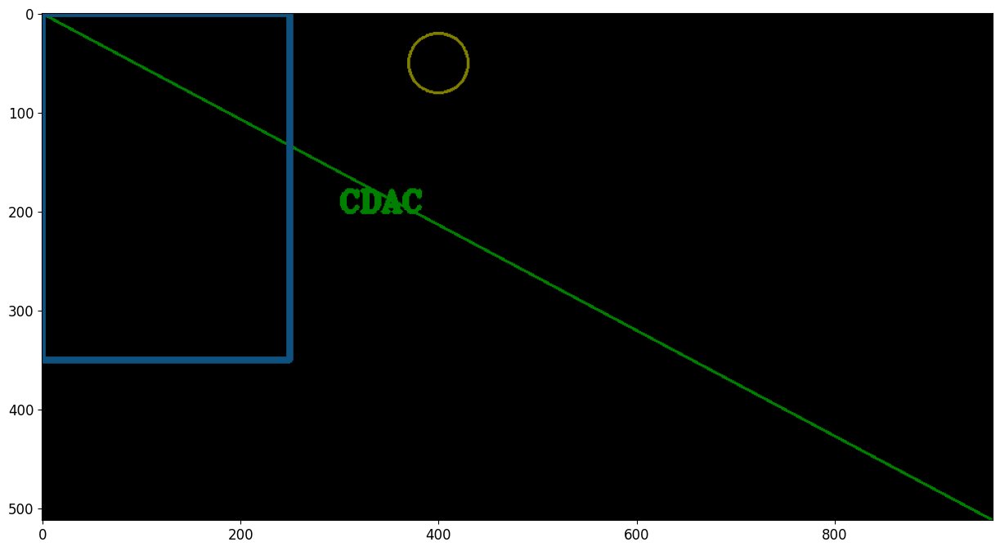

In [21]:
blnkImg = np.zeros((512, 960, 3), np.int8)

cv2.line(blnkImg, (0,0), (blnkImg.shape[1], blnkImg.shape[0]), (0,255,0), 2)

cv2.rectangle(blnkImg, (0,0), (250,350), MARK_COLOR, 5)

cv2.circle(blnkImg, (400,50), 30, (255,255,0), 2)

cv2.putText(blnkImg, 'CDAC', (300,200), cv2.FONT_HERSHEY_TRIPLEX, 1, (0,150,0), 3)

plt.imshow(blnkImg);

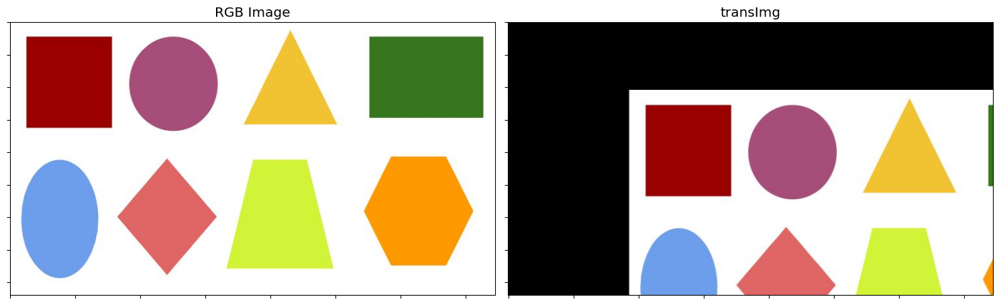

In [22]:
height , width = srcImg.shape[:2]
quarter_height , quarter_width = height/4 , width/4

T = np.float32([[1, 0 , quarter_width],[0,1,quarter_height]])
transImg = cv2.warpAffine(rgbImg, T , (width, height))

img_lst = [{'img':rgbImg, 'name':'RGB Image', 'cmap': CMAP},
           {'img':transImg, 'name':'transImg','cmap':CMAP}]

fn_plot_images(img_lst)

## Affine Transform

In [23]:
srcImg.shape[0]

420

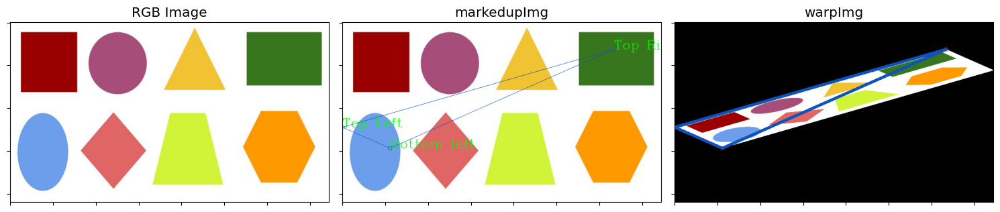

In [24]:
# create Source triangle with 'top-right', 'top-left', 'bottom-left'
srcTri = np.array( [[0, 0], [srcImg.shape[1] - 1, 0], 
                    [0, srcImg.shape[0] - 1]] ).astype(np.float32)

# Create destinations triangle
tl = [0, int(srcImg.shape[1]*0.33)]
tr = [int(srcImg.shape[1]*0.85), int(srcImg.shape[0]*0.15)]
bl = [int(srcImg.shape[1]*0.15), int(srcImg.shape[0]*0.7)]

# convert to array
dstTri = np.array( [tl, tr, bl ] ).astype(np.float32)

# mark points on the image for display
markedupImg = rgbImg.copy()

cv2.circle(markedupImg, (tl), 5, MARK_COLOR, LINE_THICK)
cv2.putText(markedupImg, 'Top Left', (tl), cv2.FONT_HERSHEY_COMPLEX,1,
            (0,255,0), 1)

cv2.circle(markedupImg, (tr), 5, MARK_COLOR, LINE_THICK)
cv2.putText(markedupImg, 'Top Right', (tr), cv2.FONT_HERSHEY_COMPLEX,1,
            (0,255,0), 1)

cv2.circle(markedupImg, (bl), 5, MARK_COLOR, LINE_THICK)
cv2.putText(markedupImg, 'Bottom left', (bl), cv2.FONT_HERSHEY_COMPLEX,1,
            (0,255,0), 1)

# mark the triangle
isClosed = True
 
# Blue color in RGB
#color = (0, 0, 255)

poly = np.array([tl,tr,bl], np.int32)

poly = poly.reshape((-1, 1, 2))

cv2.polylines(markedupImg, [poly],
                      isClosed, MARK_COLOR, LINE_THICK)

# get warp matrix for transformation
warp_mat = cv2.getAffineTransform(srcTri, dstTri)

# warp the image
warpImg = cv2.warpAffine(rgbImg, warp_mat, 
                         (srcImg.shape[1], srcImg.shape[0]))

# mark the points
tmpImg = warpImg.copy()
cv2.circle(tmpImg, (tl), 5, (255,0,0), LINE_THICK)
cv2.circle(tmpImg, (tr), 5, (255,0,0), LINE_THICK)
cv2.circle(tmpImg, (bl), 5, (255,0,0), LINE_THICK)
cv2.polylines(tmpImg, [poly],
                      isClosed, MARK_COLOR, 5)

img_lst = [{'img': rgbImg, 'name': 'RGB Image','cmap' : CMAP},
           {'img': markedupImg, 'name': 'markedupImg','cmap' : CMAP},
           {'img': tmpImg, 'name': 'warpImg','cmap' : CMAP}]


fn_plot_images(img_lst)

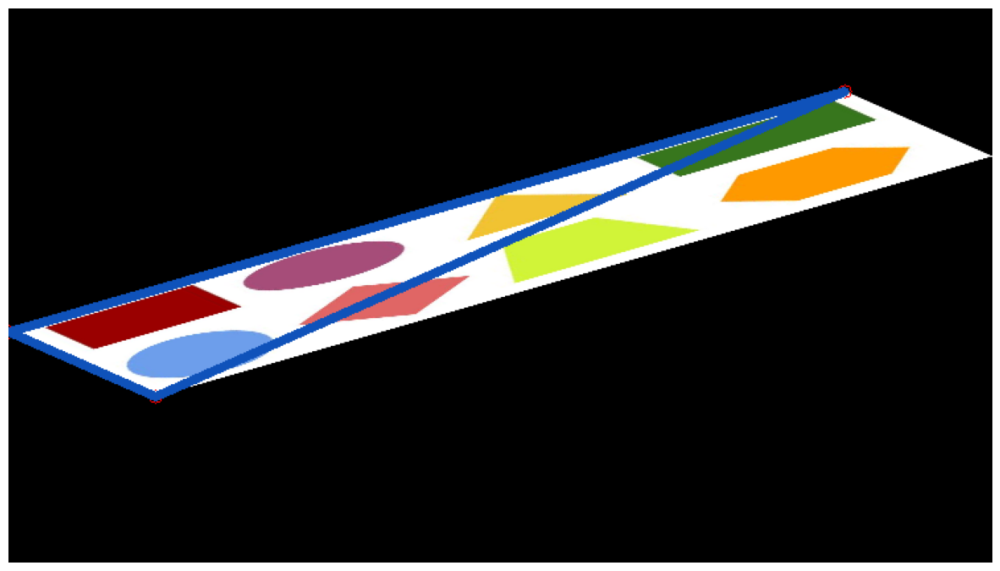

In [25]:
fn_plot_one_img(tmpImg)

### Rotation 

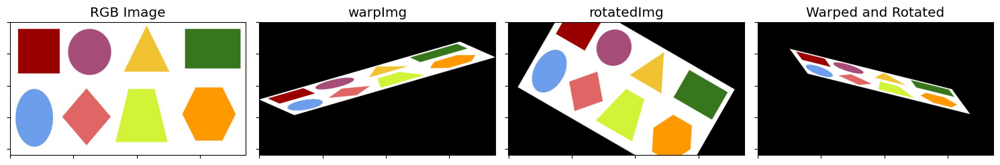

In [26]:
center = (warpImg.shape[1]//2, warpImg.shape[0]//2)
angle = -30
scale = 0.8

# We need to create a matrix to rotate
rot_mat = cv2.getRotationMatrix2D( center, angle, scale )

rotatedImg = cv2.warpAffine(rgbImg, rot_mat, (srcImg.shape[1], 
                                              srcImg.shape[0]))

wNrImg = cv2.warpAffine(warpImg, rot_mat, (srcImg.shape[1], 
                                           srcImg.shape[0]))

img_lst = [{'img': rgbImg, 'name': 'RGB Image','cmap' : CMAP},
           {'img': warpImg, 'name': 'warpImg','cmap' : CMAP},
           {'img': rotatedImg, 'name': 'rotatedImg','cmap' : CMAP},
           {'img': wNrImg, 'name': 'Warped and Rotated','cmap' : CMAP}]

fn_plot_images(img_lst)

### Perspective Transform

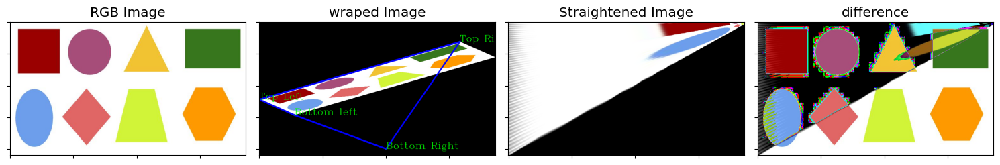

In [27]:
#br = [400, 379]
br = [400, 400]

# Polygon corner points coordinates in  a consistent order of the points
poly = np.array([tl, bl, br, tr], np.int32)

# To draw a polygon, first you need coordinates of vertices. Make those points
# into an array of shape ROWSx1x2 where ROWS are number of vertices 
# and it should be of type int32.
poly1 = poly.reshape((-1, 1, 2))

# is it a closed polygon
isClosed = True
 
# Blue color in BGR
color = (0, 0, 255)
 
# Line thickness of 3 px
thickness = 3

# make a copy of wraped Image
tmpImg = warpImg.copy()

# Mark draw a the polygon
cv2.polylines(tmpImg, [poly1],
                      isClosed, color, thickness)

# Mark points on the image
cv2.circle(tmpImg, (tl), 3, MARK_COLOR, LINE_THICK)
cv2.putText(tmpImg, 'Top Left', (tl), cv2.FONT_HERSHEY_COMPLEX,1, (0,255,0), 1)

cv2.circle(tmpImg, (tr), 3, MARK_COLOR, LINE_THICK)
cv2.putText(tmpImg, 'Top Right', (tr), cv2.FONT_HERSHEY_COMPLEX,1, (0,255,0), 1)

cv2.circle(tmpImg, (bl), 3, MARK_COLOR, LINE_THICK)
cv2.putText(tmpImg, 'Bottom left', (bl), cv2.FONT_HERSHEY_COMPLEX,1, (0,255,0), 1)

cv2.circle(tmpImg, (br), 3, MARK_COLOR, LINE_THICK)
cv2.putText(tmpImg, 'Bottom Right', (br), cv2.FONT_HERSHEY_COMPLEX,1, (0,255,0), 1)

# now that we have the dimensions of the new image, construct
# the set of destination points to obtain a (i.e. top-down view)
# of the image, again specifying points
# in the top-left, top-right, bottom-right, and bottom-left
# order

src = np.array([tl, tr, br, bl], dtype = 'float32')
dst = np.array([[0, 0],
                [width, 0],
                [width, height],
                [0, height]], dtype = "float32")

# Create Transformation matrix
matrix = cv2.getPerspectiveTransform(src,dst)

# Transform the image
strImg = cv2.warpPerspective(warpImg, matrix, (width, height))

# Check the difference
diffImg = rgbImg - strImg

img_lst = [{'img': rgbImg, 'name': 'RGB Image','cmap' : CMAP},
           {'img': tmpImg, 'name': 'wraped Image','cmap' : CMAP},
           {'img': strImg, 'name': 'Straightened Image','cmap' : CMAP},
           {'img': diffImg, 'name': 'difference','cmap' : CMAP},]

fn_plot_images(img_lst)

### Contours

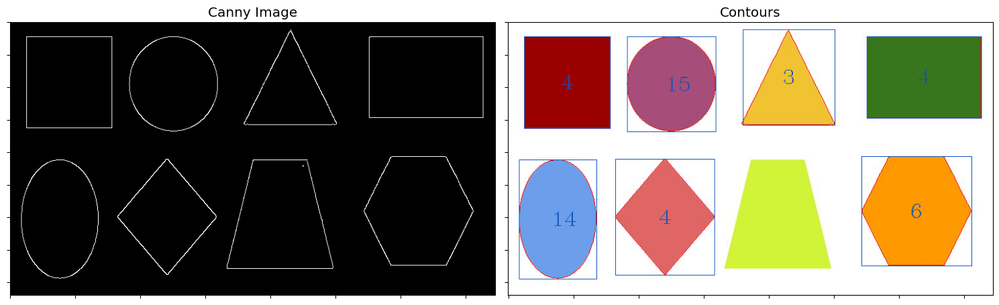

In [28]:
def getContours(im):
    
    contours, hierarchy = cv2.findContours(im, 
                                           cv2.RETR_EXTERNAL, 
                                           cv2.CHAIN_APPROX_NONE) # good for finding outer countours
    
    for cnt in contours:
        
        area = cv2.contourArea(cnt)
        
        if area  > 100:
            
            cv2.drawContours(contoursImg, cnt, -1, (255,0,0), 1) # plot where area is significant
            
            peri = cv2.arcLength(cnt, True)
            
            #print (area, peri)
            
            # get approx corner point
            approx = cv2.approxPolyDP(cnt, 0.01*peri, True) 
            
            #print (area, '|', len(approx))
            
            objCor = len(approx)
            
            # get bounding box of the approx
            x, y, w, h = cv2.boundingRect(approx)
            
            cv2.rectangle(contoursImg, (x,y), (x+w, y+h), MARK_COLOR)
                
            cv2.putText(contoursImg, str(objCor), 
                            (x+w//2-10, y+h//2+10), # Origin
                            cv2.FONT_HERSHEY_COMPLEX, #fontFace
                            1,             #fontScale                            
                            MARK_COLOR, #color
                            1) # thickness
        
        
contoursImg = rgbImg.copy()
    
getContours(cannyImg)

img_lst = [#{'img': rgbImg, 'name': 'RGB Image','cmap' : CMAP},
           {'img': cannyImg, 'name': 'Canny Image','cmap' : 'gray'},
           {'img': contoursImg, 'name': 'Contours','cmap' : CMAP}]

fn_plot_images(img_lst)

In [29]:
imgFileName = '/home/dai/directory_env/notebooks/input/basic_operations/bubblingFish.jpg'

srcImg, rgbImg = fn_read_image(imgFileName)

print (srcImg.shape)

(480, 640, 3)


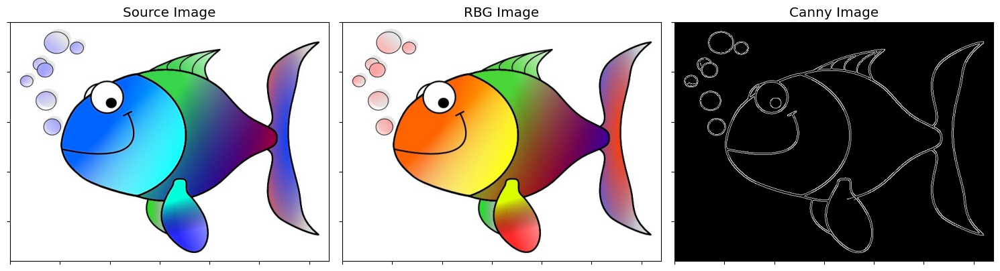

In [30]:
grayImg = cv2.cvtColor(srcImg, cv2.COLOR_BGR2GRAY) 

cannyImg = cv2.Canny(grayImg, 30, 200) 

rgbImg = cv2.cvtColor(srcImg, cv2.COLOR_BGR2RGB)

img_lst = [{'img': srcImg, 'name': 'Source Image','cmap' : CMAP},
           {'img': rgbImg, 'name': 'RBG Image','cmap' : CMAP},
           {'img': cannyImg, 'name': 'Canny Image','cmap' : 'gray'}]

fn_plot_images(img_lst)

In [31]:
contours, hierarchy = cv2.findContours(cannyImg, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


print("Number of Contours: " + str(len(contours)))


Number of Contours: 88


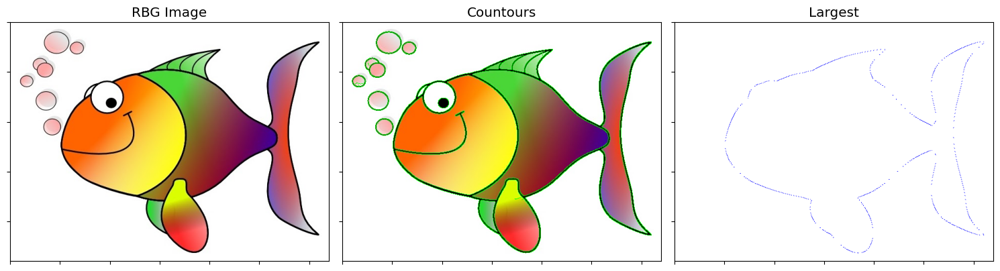

In [32]:
tmpImg = rgbImg.copy()

tmp2Img = np.ones_like(rgbImg)*255

cv2.drawContours(tmpImg, contours, -1, (0, 255, 0), 1)

if len(contours) != 0:
    c = max(contours, key = cv2.contourArea)

# Draw biggest contour in Blue
cv2.drawContours(tmp2Img, c, -1, (0, 0, 255),1)

img_lst = [{'img': rgbImg, 'name': 'RBG Image','cmap' : CMAP},
           {'img': tmpImg, 'name': 'Countours','cmap' : CMAP},
           {'img': tmp2Img, 'name': 'Largest','cmap' : CMAP}]

fn_plot_images(img_lst)

### Grab and Cut

In [33]:
srcImg.shape

(480, 640, 3)

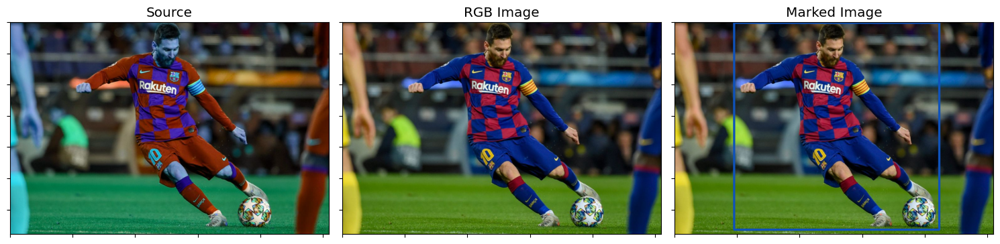

In [34]:
imgFileName = '/home/dai/directory_env/notebooks/input/basic_operations/Lionel_Messi_1.jpg'

srcImg, rgbImg = fn_read_image(imgFileName)

mkdImg = rgbImg.copy()

cv2.rectangle(mkdImg, (190, 4), (845,665), MARK_COLOR, 5)

img_lst = [{'img': srcImg, 'name': 'Source','cmap' : CMAP},
           {'img': rgbImg, 'name': 'RGB Image','cmap' : CMAP},
           {'img': mkdImg, 'name': 'Marked Image','cmap' : CMAP},
          ]
fn_plot_images(img_lst)

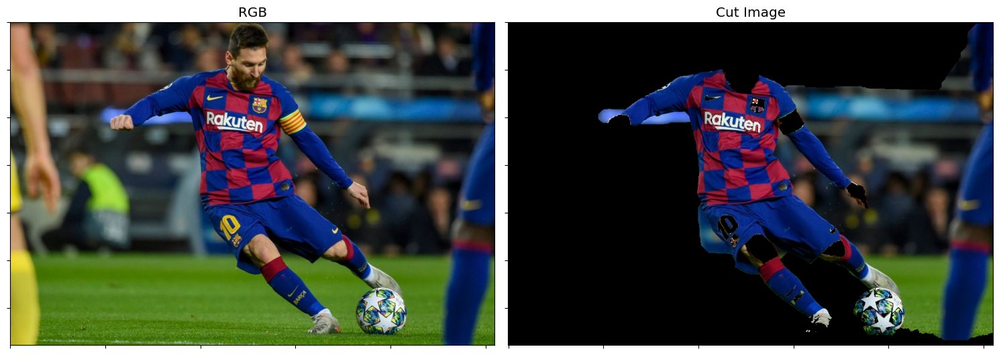

In [35]:
mask = np.zeros(rgbImg.shape[:2],np.uint8)
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
rect = (190, 4, 845,665)


cv2.grabCut(rgbImg,mask,rect,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_RECT)

mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
cutImg = rgbImg*mask2[:,:,np.newaxis]

img_lst = [{'img': rgbImg, 'name': 'RGB','cmap' : CMAP},
           {'img': cutImg, 'name': 'Cut Image','cmap' : CMAP}]
fn_plot_images(img_lst)

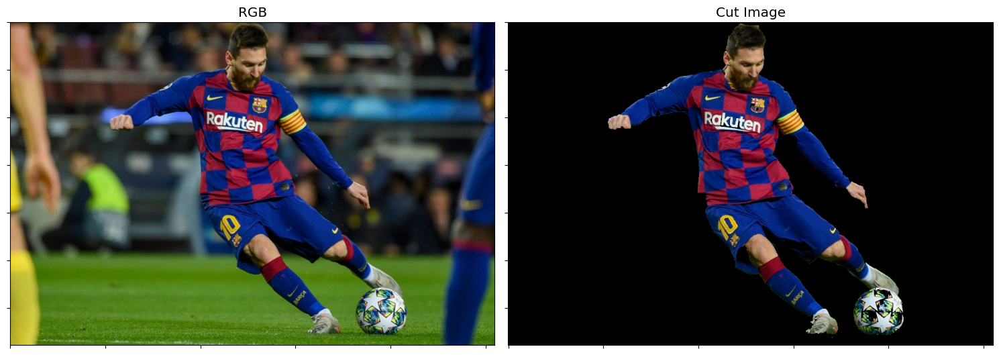

In [36]:
newmask = cv2.imread(os.path.join(inpDir, dataDir, '/home/dai/directory_env/notebooks/input/basic_operations/Lionel_Messi_mask.jpg'),0)

mask[newmask == 0] = 0
mask[newmask == 255] = 1

mask, bgdModel, fgdModel = cv2.grabCut(rgbImg, mask, None, bgdModel,fgdModel,5,cv2.GC_INIT_WITH_MASK)
mask = np.where((mask==2)|(mask==0),0,1).astype('uint8')

cutImg = rgbImg*mask[:,:,np.newaxis]

img_lst = [{'img': rgbImg, 'name': 'RGB','cmap' : CMAP},
           {'img': cutImg, 'name': 'Cut Image','cmap' : CMAP}]

fn_plot_images(img_lst)

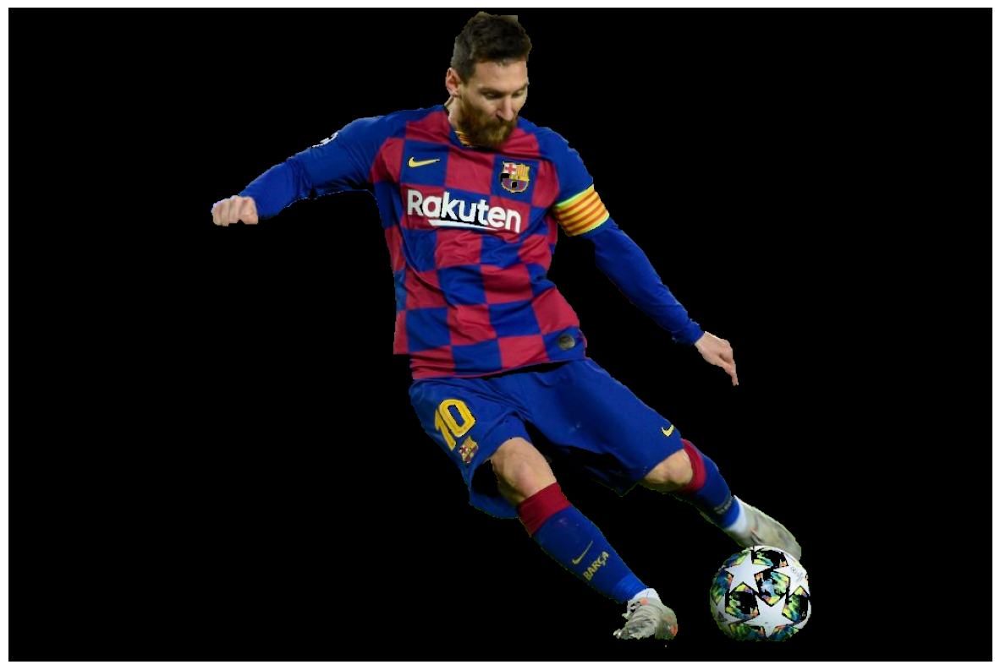

In [37]:
fn_plot_one_img(cutImg)

### Low Contrast Images
### Histogram Equalization

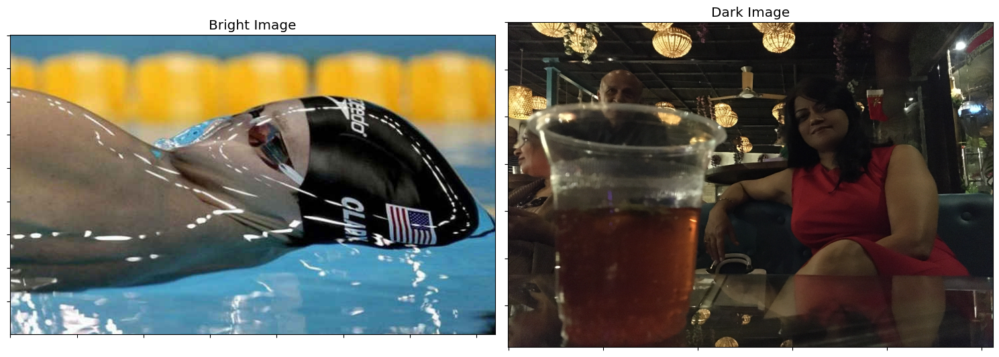

In [38]:
# load bright image
bFileName = '/home/dai/directory_env/notebooks/input/basic_operations/11.jpeg' #'DSC_2477.JPG'

brightImg, brightRBG = fn_read_image(bFileName)

# Resizing to reduce processing time
#brightImg = cv2.resize(brightImg, ( 1024, 688))
#brightRBG = cv2.resize(brightRBG, ( 1024, 688))


# load dark image
dFileName = '/home/dai/directory_env/notebooks/input/basic_operations/dark_image.png'#'kids.jpeg'

darkImg, darkRBG  = fn_read_image(dFileName)

# Resizing to reduce processing time
darkImg = cv2.resize(darkImg, ( 1024, 688))
darkRBG = cv2.resize(darkRBG, ( 1024, 688))


img_lst = [{'img': brightRBG, 'name': 'Bright Image','cmap' : CMAP},
           {'img': darkRBG, 'name': 'Dark Image','cmap' : CMAP}]

fn_plot_images(img_lst)

In [39]:
darkImg.shape

(688, 1024, 3)

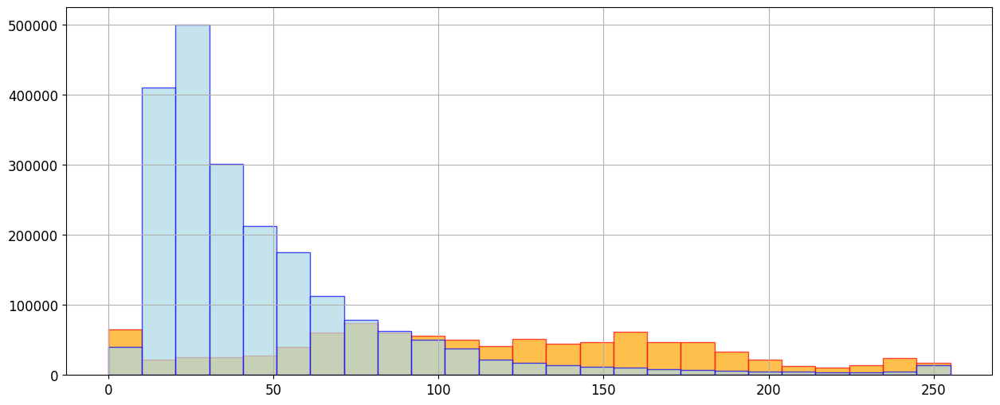

In [40]:
plt.figure(figsize=(15,6))
plt.hist(brightImg.flatten(), bins = 25, alpha = 0.7, 
         color = 'orange', ec = 'r')

plt.hist(darkImg.flatten(), bins = 25, alpha = 0.7, 
         color = 'lightblue', 
         ec = 'b')

plt.grid()

plt.show()

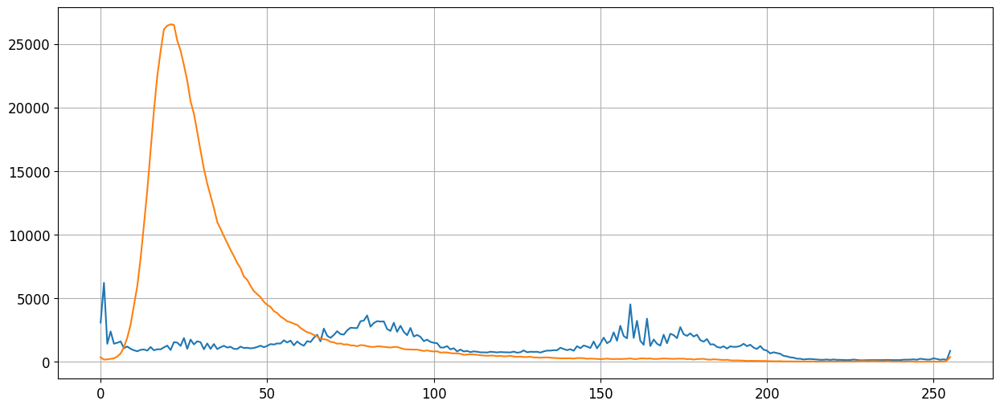

In [41]:
# Calculate histogram using cv2.calcHist()
brightHist = cv2.calcHist([brightImg], [0], None, [256], [0,256])
darkHist = cv2.calcHist([darkImg], [0], None, [256], [0,256])

# Display the histogram
plt.figure(figsize=(15,6))
plt.plot(brightHist)
plt.plot(darkHist)
plt.grid();

### 2 D histogram

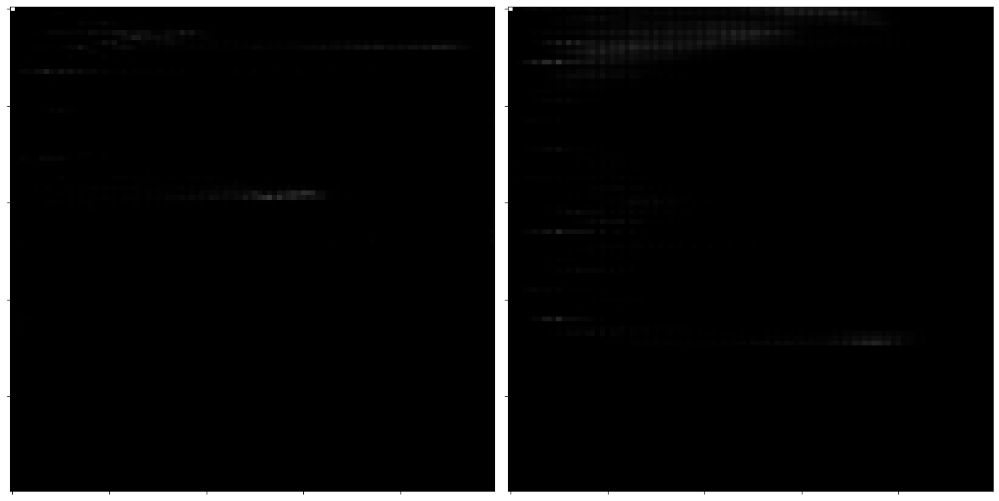

In [42]:
# first convert to HSV. In HSV mode 2 channels can represent color. 
brightHSV = cv2.cvtColor(brightImg, cv2.COLOR_BGR2HSV)
darkHSV = cv2.cvtColor(darkImg, cv2.COLOR_BGR2HSV)

# 2D histogram for Blue and Green channels.
brightHist = cv2.calcHist([brightHSV], [0, 1], None, [100, 100], 
                          [0, 256, 0, 256])

darkHist = cv2.calcHist([darkHSV], [0, 1], None, [100, 100], 
                        [0, 256, 0, 256])


# show using matplotlib
fig, axes = plt.subplots(1, 2)

ax = axes[0]
ax.imshow(brightHist, interpolation='nearest', cmap = 'gray')
ax.set_xticklabels([]);
ax.set_yticklabels([]);

ax = axes[1]
ax.imshow(darkHist, interpolation='nearest', cmap = 'gray')
ax.set_xticklabels([]);
ax.set_yticklabels([]);
plt.tight_layout()

### Histogram Equalization

True

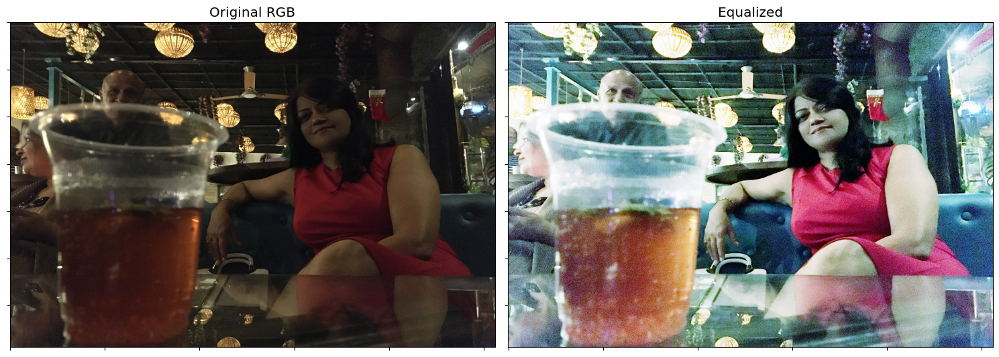

In [43]:
equalBlue = cv2.equalizeHist(darkImg[:, :, 0]) 
equalGreen = cv2.equalizeHist(darkImg[:, :, 1]) 
equalRed = cv2.equalizeHist(darkImg[:, :, 2]) 

equalRBG = np.zeros_like(darkImg)
equalRBG[:, :, 0] = equalRed
equalRBG[:, :, 1] = equalGreen
equalRBG[:, :, 2] = equalBlue

img_lst = [{'img': darkRBG, 'name': 'Original RGB','cmap' : CMAP},
           {'img': equalRBG, 'name': 'Equalized','cmap' : CMAP}]

fn_plot_images(img_lst)

cv2.imwrite(os.path.join(outDir,'dark_image_equal.png'), 
            cv2.cvtColor(equalRBG, cv2.COLOR_RGB2BGR))

### Adaptive Histogram Equalization
### What if image has significant dark portions.

True

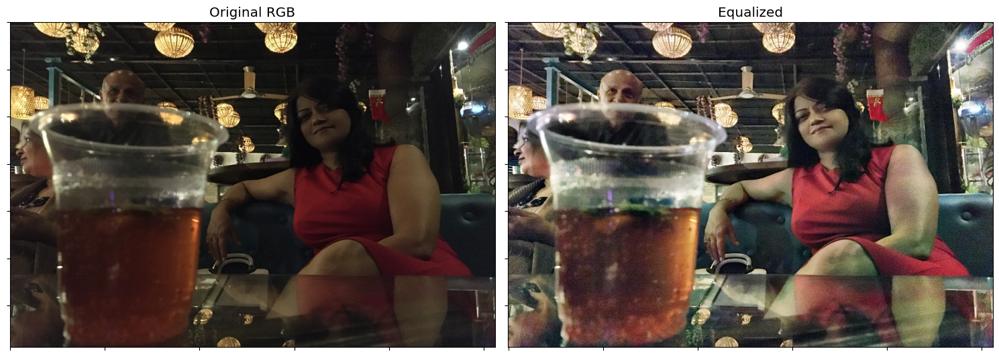

In [44]:
# Resizing to reduce processing time
#darkImg = cv2.resize(darkImg, ( 1024, 688))

#darkRBG = cv2.cvtColor(darkImg, cv2.COLOR_BGR2RGB)

# create a CLAHE object (Arguments are optional).
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
claheBlue = clahe.apply(darkImg[:,:, 0])
claheGreen = clahe.apply(darkImg[:,:, 1])
claheRed = clahe.apply(darkImg[:,:, 2])

claheImg = np.zeros_like(darkImg)

claheImg [ :, :, 0] = claheRed
claheImg [ :, :, 1] = claheGreen
claheImg [ :, :, 2] = claheBlue

 
img_lst = [{'img': darkRBG, 'name': 'Original RGB','cmap' : CMAP},
           {'img': claheImg, 'name': 'Equalized','cmap' : CMAP}]

fn_plot_images(img_lst)


cv2.imwrite(os.path.join(outDir,'dark_image_clahe.png'), cv2.cvtColor(claheImg, cv2.COLOR_RGB2BGR))

### Interpolations

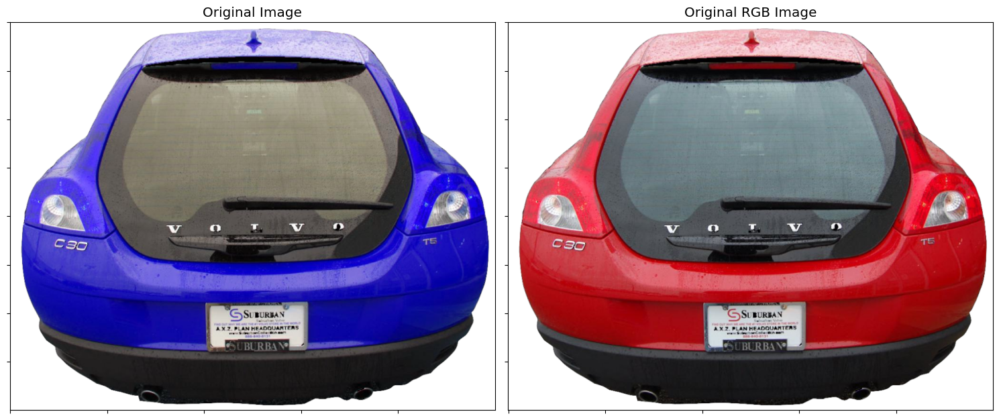

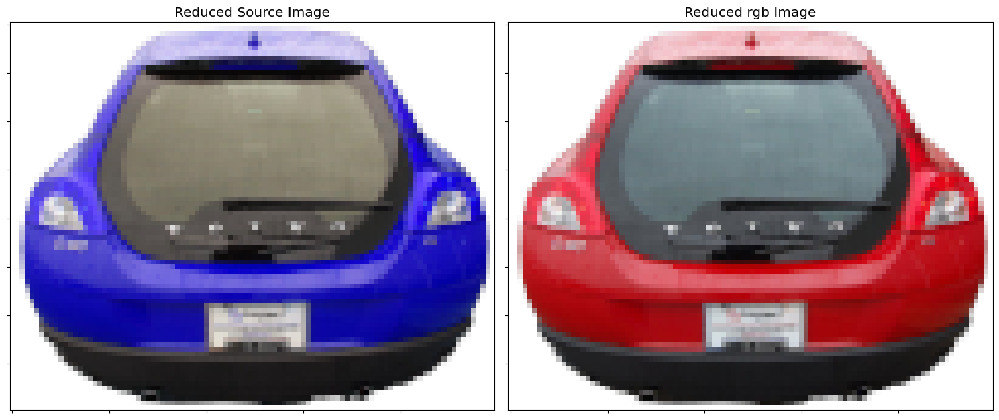

In [45]:
# load bright image
imgFileName = '/home/dai/directory_env/notebooks/input/basic_operations/car_2_small.png'
oFileName = '/home/dai/directory_env/notebooks/input/basic_operations/car_2_cropped.png'

srcImg, rgbImg = fn_read_image(imgFileName)
oImg, oRgbImg  = fn_read_image(oFileName)

img_lst = [{'img': oImg, 'name': 'Original Image','cmap' : CMAP},
           {'img': oRgbImg, 'name': 'Original RGB Image','cmap' : CMAP}]

fn_plot_images(img_lst)

img_lst = [{'img': srcImg, 'name': 'Reduced Source Image','cmap' : CMAP},
           {'img': rgbImg, 'name': 'Reduced rgb Image','cmap' : CMAP}]

fn_plot_images(img_lst)



### Nearest

Shape of source (80, 100, 3) Shape of destination (800, 1000, 3)


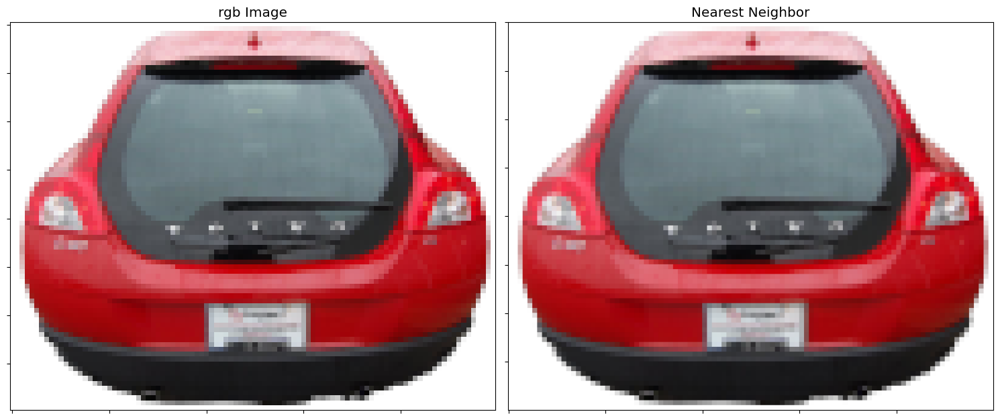

In [46]:
nearImg = cv2.resize(rgbImg, None, fx = 10, fy = 10, 
                     interpolation = cv2.INTER_NEAREST)

img_lst = [{'img': rgbImg, 'name': 'rgb Image','cmap' : CMAP},
           {'img': nearImg, 'name': 'Nearest Neighbor','cmap' : CMAP}]
print ('Shape of source', rgbImg.shape, 'Shape of destination', nearImg.shape)
fn_plot_images(img_lst)

### Bi-Linear

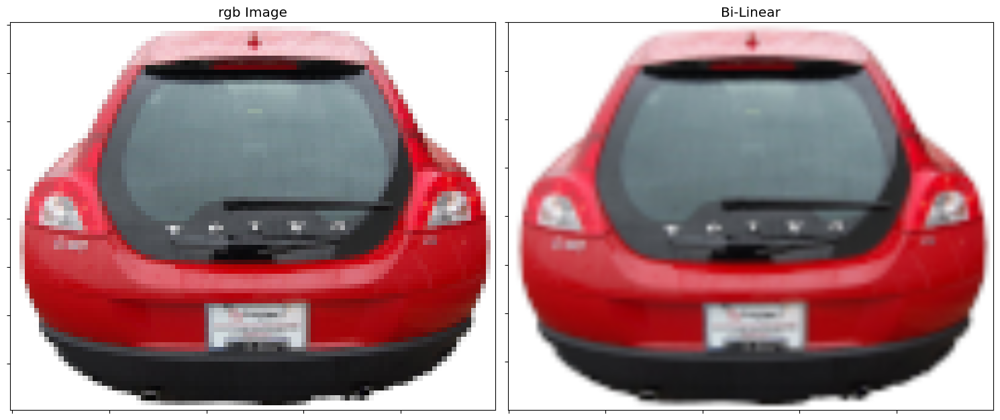

In [47]:
bLinImg = cv2.resize(rgbImg, None, fx = 10, fy = 10, 
                     interpolation = cv2.INTER_LINEAR)

img_lst = [{'img': rgbImg, 'name': 'rgb Image','cmap' : CMAP},
           {'img': bLinImg, 'name': 'Bi-Linear','cmap' : CMAP}]

fn_plot_images(img_lst)

### Bi-Cubic Interpolation

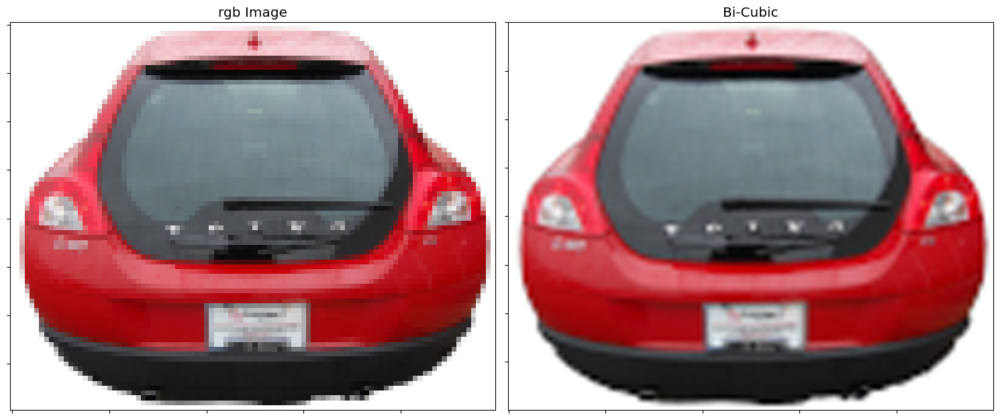

In [48]:
bCubImg = cv2.resize(rgbImg, None, fx = 10, fy = 10,
                     interpolation = cv2.INTER_CUBIC)

img_lst = [{'img': rgbImg, 'name': 'rgb Image','cmap' : CMAP},
           {'img': bCubImg, 'name': 'Bi-Cubic','cmap' : CMAP}]

fn_plot_images(img_lst)

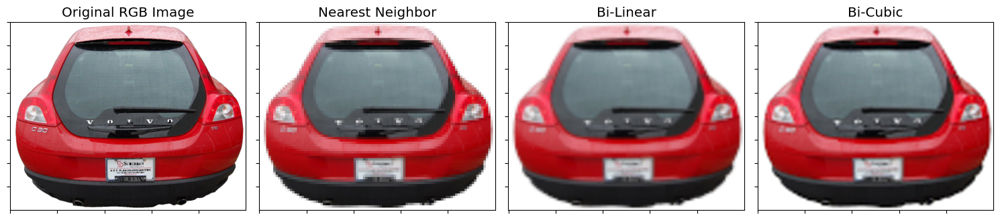

In [49]:
img_lst = [{'img': oRgbImg, 'name': 'Original RGB Image','cmap' : CMAP},
           {'img': nearImg, 'name': 'Nearest Neighbor','cmap' : CMAP},
           {'img': bLinImg, 'name': 'Bi-Linear','cmap' : CMAP},
           {'img': bCubImg, 'name': 'Bi-Cubic','cmap' : CMAP}]



# Display the images
fn_plot_images(img_lst)

<b>------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------<b>
### End of day 1